In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from sklearn import metrics
import tabulate
import itertools
import umap
from importlib import reload
from scipy import stats
import matplotlib.image as mpimg

# locals
import utils as ut
reload(ut)

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/utils.py'>

In [2]:
sc.settings.verbosity = 3 

In [3]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scRNAseq/"

adata = {}

for f in os.listdir(dirPath):
    
    if not f == "all":
        cond = f
        mtxPath = f"{dirPath}{f}"
        data = sc.read_10x_mtx(mtxPath, cache=True)
        data.var_names = [x.upper() for x in data.var_names] # uppercase gene names
        adata[cond] = data
    
print("done")

... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD14-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-ND-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD8-matrix.h5ad
done


# Filters

In [4]:
# ?sc.pp.scale

In [5]:
min_genes = 500
# min_cells = 3
min_cells = 5

for d, data in adata.items():
    print(d)
    sc.pp.filter_cells(data, min_genes=min_genes)
    sc.pp.filter_genes(data, min_cells=min_cells)
    sc.pp.normalize_total(data, target_sum=1e4) # Normalize each cell by total counts over all genes
    sc.pp.log1p(data) # Logarithmize data via `X = \log(X + 1)`,
    sc.pp.scale(data) # unit variance and zero mean

HFD14
filtered out 710 cells that have less than 500 genes expressed
filtered out 16525 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
ND
filtered out 153 cells that have less than 500 genes expressed
filtered out 17356 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
HFD8
filtered out 435 cells that have less than 500 genes expressed
filtered out 16154 genes that are detected in less than 5 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Pooled embedding for vizualization

In [6]:
# # create a common embedding for all cells across all times


# keys = ['ND', 'HFD8', 'HFD14']

# # plotting params
# n_components = 2 # should always be 2
# n_neighbors = 3
# min_dist = 0.1

# # first, get genes present in all three times points
# genesByKey = []
# for i, key in enumerate(keys):
#     data = adata[key]
#     genes = set(data.to_df().columns)
#     genesByKey.append(genes)
    

# commmonGenes = set.intersection(*genesByKey)
# print(f"{len(commmonGenes)} genes at all three times")

# # build a dataframe with all cells
# dfList = []
# indices = {}

# lastInd = 0
# for i, key in enumerate(keys):
#     data = adata[key]
#     df = data.to_df().T
#     indRange = (lastInd, df.shape[1] + lastInd - 1)
#     lastInd += df.shape[1] 
    
#     indices[key] = np.array(range(indRange[0], indRange[1] + 1))
    
#     print(key, df.shape, indRange)
#     df = df[df.index.isin(commmonGenes)]
#     df = df.sort_index(ascending=False)
#     dfList.append(df.T)
    
# X = pd.concat(dfList, axis=0, ignore_index=False)
# X = X.fillna(0) # handle nans introduced by merging
# print(X.shape)

# umap_reducer = umap.UMAP(n_components=n_components,
#                          n_neighbors=n_neighbors,
#                          min_dist=min_dist)

# pooled_embedding = umap_reducer.fit_transform(X) # we need embedding by cell
# pooled_embedding = pd.DataFrame(pooled_embedding)
# pooled_embedding.columns = ['umap1', 'umap2']
# pooled_embedding.head()

# Clustering

In [7]:
# ?sc.tl.leiden
# ?sc.pl.umap
# sc.pp.neighbors

In [8]:
runKeys = []

In [9]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

# the big choices
n_neighbors = 21
n_pcs = 30
resolution = 0.9

runKey = f"nn{n_neighbors}_pca{n_pcs}_r{resolution}"
runKeys.append(runKey)

"""The parameter functions as a sort of threshold: communities should have a density of at least γ, 
while the density between communities should be lower than γ. 
Higher resolutions lead to more communities and lower resolutions lead to fewer communities, 
similarly to the resolution parameter for modularity."""

# clustering
for d, data in adata.items():
    
    # 1. project into low-dimensional space
    sc.tl.pca(data, 
              n_comps=n_pcs, 
              svd_solver='arpack')
    
    # 2. build neighborhood graph
    sc.pp.neighbors(data, 
                    n_neighbors=n_neighbors)
    
    # just for visualization purposes 
    sc.tl.umap(data)
    
    # 3. modularity clustering via leiden algorithm
    sc.tl.leiden(data,
                 resolution=resolution,
                 key_added=runKey)
    
    # break
print('DONE.')

computing PCA
    with n_comps=30
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 19 clusters and added
    'nn15_pca30_r0.8', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    with n_comps=30
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 17 clusters and added
    'nn15_pca30_r0.8', the cluster labels

In [10]:
# colorlist = ut.ncolor(3, cmap='viridis')

# for i, key in enumerate(keys):
#     ind = indices[key]
    
#     tdf = pooled_embedding.iloc[ind]
#     plt.scatter(tdf['umap1'],
#                 tdf['umap2'],
#                 s=5,
#                 color=colorlist[i],
#                 alpha=0.4,
#                 label=key, 
#                 zorder=1/(i+1))

# plt.legend()
# plt.xlabel('umap 1')
# plt.ylabel('umap 2')

In [11]:
# # plot clusters using pooled embeddings

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     k = data.obs['leiden'].nunique()
#     colorlist = ut.ncolor(k, cmap='viridis')

#     embedding = pooled_embedding.iloc[indices[key]].to_numpy()
    
#     for i in range(k):
        
#         plt.scatter(embedding[clusterIds == i , 0] , 
#                     embedding[clusterIds == i , 1] , 
#                     c=colorlist[i],
#                     edgecolor="None",
#                     s=10,
#                     alpha=0.6,
#                     label=i+1,)
        
#     plt.title(key)
#     plt.legend(bbox_to_anchor=(1.2, 1.025))
#     plt.xlabel("umap 1")
#     plt.ylabel("umap 2")
#     plt.show()

In [12]:
# # plot clusters using individual embeddings
# # shows how well defined the clusters are at a single time point
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     k = data.obs['leiden'].nunique()
#     colorlist = ut.ncolor(k, cmap='viridis')

#     embedding = data.obsm['X_umap']

#     for i in range(k):
#         plt.scatter(embedding[clusterIds == i , 0] , 
#                     embedding[clusterIds == i , 1] , 
#                     c=colorlist[i],
#                     edgecolor="None",
#                     s=10,
#                     alpha=0.6,
#                     label=i+1,)
    
#     plt.title(key)
#     plt.legend(bbox_to_anchor=(1.2, 1.025))
#     plt.xlabel("umap 1")
#     plt.ylabel("umap 2")
#     plt.show()

# Cluster Metrics

In [13]:
# sc.settings.verbosity = 1
# keys = ['ND', 'HFD8', 'HFD14']
# n = 10

# res = []

# # the big choices
# nns = np.linspace(5, 70, n).astype(int)
# npcs = np.linspace(10, 80, n).astype(int)
# rrs = np.linspace(.1, 1, n)

# for key in keys:
#     data = adata[key]

#     # loop through params
#     for nn in nns:
#         for npc in npcs:
#             for r in rrs:

#                 sc.tl.pca(data, n_comps=npc)

#                 # 2. build neighborhood graph
#                 sc.pp.neighbors(data, n_neighbors=nn)

#                 # 3. modularity clustering via leiden algorithm
#                 sc.tl.leiden(data, resolution=r)
                
#                 # extract the labels and projected data
#                 labels = data.obs['leiden'].astype(int).to_numpy()
#                 X = data.obsm['X_umap']
                
#                 #. compute metrics
#                 sil = metrics.silhouette_score(X, labels, metric='euclidean')
#                 vrc = metrics.calinski_harabasz_score(X, labels)
#                 dbs = metrics.davies_bouldin_score(X, labels)
                
#                 row = {
#                    'key' : key,
#                     'nPCA' : npc,
#                     'nn' : nn,
#                     'resolution' : r,
#                     'silhouetteScore' : sil,
#                     'varianceRatioCriterion' : vrc,
#                     'DaviesBouldin' : dbs
#                 }
                
#                 res.append(row)
#     break
                
                

# res = pd.DataFrame(res)
# res.sort_values(by='silhouetteScore', ascending=False).head(5)
# res.to_csv('clusterEval.csv', index=False)

In [14]:

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    labels = data.obs[runKey].astype(int).to_numpy()
    n = len(set(labels))
    # X = data.obsp['connectivities'].todense()
    X = data.obsm['X_umap']
    sil = metrics.silhouette_score(X, labels, metric='euclidean')
    
    print(f"{key} {n} clusters Silhouette: {sil:.4f} (UMAP Projection)")

ND 17 clusters Silhouette: 0.4215 (UMAP Projection)
HFD8 20 clusters Silhouette: 0.3394 (UMAP Projection)
HFD14 19 clusters Silhouette: 0.2128 (UMAP Projection)


# Score marker genes

## pangloadb

In [15]:
choose = 50 # number of genes to consider

# load gene lists 
pandPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"        
pandf = ut.read_panglaodb(pandPath)

controlList = [
    # 'Adipocyte progenitor cells', 
    'Adipocytes',
    'B cells', 
    # 'B cells memory', 
    # 'B cells naive',
    'Dendritic cells',
    'Macrophages',
    'Monocytes', 
    # 'Natural killer T cells',
    'NK cells',
    'T cells', 
    # 'T cells naive', 
    # 'T cytotoxic cells',
    # 'T follicular helper cells', 
    # 'T helper cells', 
    # 'T memory cells',
    # 'T regulatory cells', 
]

allMarkers = pandf[pandf['cell type'].isin(controlList)]
print(pd.DataFrame(allMarkers['cell type'].value_counts()))
print()
"""
Ubiquitousness Index (0-1). 
0 indicates the gene is not expressed in any cell cluster and 
1 (maximum) indicates that the gene is expressed in all cell clusters. 
"""

mfList = []

for ctype in controlList:
    cf = allMarkers[allMarkers['cell type'] == ctype]
    
    cf = cf.sort_values(by='ubiquitousness index',
                        ascending=True)
    
    mfList.append(cf[['cell type', 'gene']].head(choose))


markerGenes = pd.concat(mfList, ignore_index=True)
print(pd.DataFrame(markerGenes['cell type'].value_counts()))
print()

                 cell type
Macrophages            153
Dendritic cells        133
Adipocytes             120
B cells                110
T cells                107
Monocytes              102
NK cells                98

                 cell type
Adipocytes              50
B cells                 50
Dendritic cells         50
Macrophages             50
Monocytes               50
NK cells                50
T cells                 50



## asuscomm

In [16]:
# asuscommPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/asuscomm/markerGenes.txt"
# asuscomm = pd.read_csv(asuscommPath, sep='\t')

# controlList = [
#     'Adipocytes',
#     # 'Adipose progenitor cells',
#     # 'Pro-B cells',
#     # 'Pre-B cells',
#     'Naive B cells',
#     'Memory B cells',
#     'Plasma B cells',
#     'Naive CD8+ T cells',
#     'Naive CD4+ T cells',
#     'Memory CD8+ T cells',
#     'Memory CD4+ T cells',
#     # 'Effector CD8+ T cells',
#     # 'Effector CD4+ T cells',
#     # 'CD8+ NKT-like cells',
#     # 'CD4+ NKT-like cells',
#     'Natural killer cells',
#     'Classical Monocytes',
#     'Non-classical monocytes',
#     'Intermediate monocytes',
#     'Macrophages',
#     # 'Myeloid Dendritic cells',
#     # 'Plasmacytoid Dendritic cells',
# ]

# asuscomm = asuscomm[asuscomm['Cell type'].isin(controlList)]

# newRows = []
# for idx, row in asuscomm.iterrows():
    
#     for gene in row['Marker genes'].split(","):
#         nrow = {
#             'cell type' : row['Cell type'],
#             'gene' : gene.upper(),
#         }
#         newRows.append(nrow)
        


# markerGenes = pd.DataFrame(newRows)
# pd.DataFrame(markerGenes['cell type'].value_counts())

# rank genes

In [17]:
method = 't-test'

"""NOTE: can use different run keys"""

for d, data in adata.items():    
    sc.tl.rank_genes_groups(data, runKey, method=method)
    
print("done")

ranking genes


/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by grou

In [18]:
# ?sc.tl.rank_genes_groups

In [19]:
geneLists = {}

useABS = False
expon = 5
normRank = True
expRank = True
keys = ['ND', 'HFD8', 'HFD14']

scoreFrame = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    newRows = []
    
    for ctype in markerGenes['cell type'].unique():
        ctypeSig = markerGenes[markerGenes['cell type'] == ctype]['gene'].to_list()
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            
            # use the abs score
            if useABS:
                t['scores'] = np.abs(t['scores'])
                
            t = t.sort_values(by='scores', ascending=False)
            t['rank'] = t['scores'].rank()
            
            if normRank:
                t['rank'] = t['rank'].apply(lambda x: x / len(t)) # normalize rank
                
            if expRank:
                t['rank'] = np.exp(t['rank']**expon) / np.exp(1)
                
            matches = t[t['gene'].isin(ctypeSig)].reset_index()
            s = matches['rank'].mean()
            
            row = {
                'key' : key,
                'cellType' : ctype,
                'clusterId' : int(clusterId) + 1,
                'score' : s,
            }
            
            newRows.append(row)

    res = pd.DataFrame(newRows)
    scoreFrame[key] = res

print(scoreFrame['ND'].head())

  key    cellType  clusterId     score
0  ND  Adipocytes          1  0.388079
1  ND  Adipocytes          2  0.438868
2  ND  Adipocytes          3  0.464653
3  ND  Adipocytes          4  0.432770
4  ND  Adipocytes          5  0.410849


In [20]:
# plt.plot(t['rank'])

In [21]:
"""
compute the differences between the top and second scoring cell types
"""

scoreDiffs = {}

for k, df in scoreFrame.items():
    newRows = []
    for cid in df['clusterId'].unique():
        
        cf = df[df['clusterId'] == cid]
        
        cf = cf.sort_values(by='score', ascending=False).reset_index(drop=True)
        
        top = cf.iloc[0]
        second = cf.iloc[1]
        
        row = {
            'clusterId' : cid,
            'topCellType' : cf.iloc[0]['cellType'],
            'topScore' : cf.iloc[0]['score'],
            'secondCellType' : cf.iloc[1]['cellType'],
            'secondScore' : cf.iloc[1]['score'],
            'scoreDiff' : float(cf.iloc[0]['score']) - float(cf.iloc[1]['score'])
        }
        newRows.append(row)
    scoreDiffs[k] = pd.DataFrame(newRows)    

scoreDiffs['HFD14']

,clusterId,topCellType,topScore,secondCellType,secondScore,scoreDiff
0,1,Macrophages,0.503939,Monocytes,0.431619,0.072321
1,2,Monocytes,0.632469,Macrophages,0.523895,0.108574
2,3,Macrophages,0.503011,Adipocytes,0.435897,0.067114
3,4,Macrophages,0.513867,Adipocytes,0.509163,0.004704
4,5,Macrophages,0.488367,Adipocytes,0.407189,0.081178
5,6,Macrophages,0.450652,Monocytes,0.397235,0.053417
6,7,Dendritic cells,0.647554,Macrophages,0.509542,0.138012
7,8,Adipocytes,0.489010,Macrophages,0.485354,0.003656
8,9,Macrophages,0.559002,Monocytes,0.494148,0.064854
9,10,NK cells,0.800707,T cells,0.800269,0.000438


In [22]:
def cellTypebyMax(df):
    """A function to assign cluster ids to the max score"""
    # df['max_score'] = df.groupby('clusterId')['score'].transform('max')
    df = df.sort_values(by=['score', 'clusterId'], ascending=[False, True])
    df = df.drop_duplicates(subset=['clusterId'])
    return df

res = cellTypebyMax(scoreFrame['HFD14'])
res

,key,cellType,clusterId,score
104,HFD14,NK cells,10,0.800707
31,HFD14,B cells,13,0.793912
129,HFD14,T cells,16,0.677992
44,HFD14,Dendritic cells,7,0.647554
77,HFD14,Monocytes,2,0.632469
52,HFD14,Dendritic cells,15,0.585132
51,HFD14,Dendritic cells,14,0.575316
16,HFD14,Adipocytes,17,0.563181
65,HFD14,Macrophages,9,0.559002
49,HFD14,Dendritic cells,12,0.558830


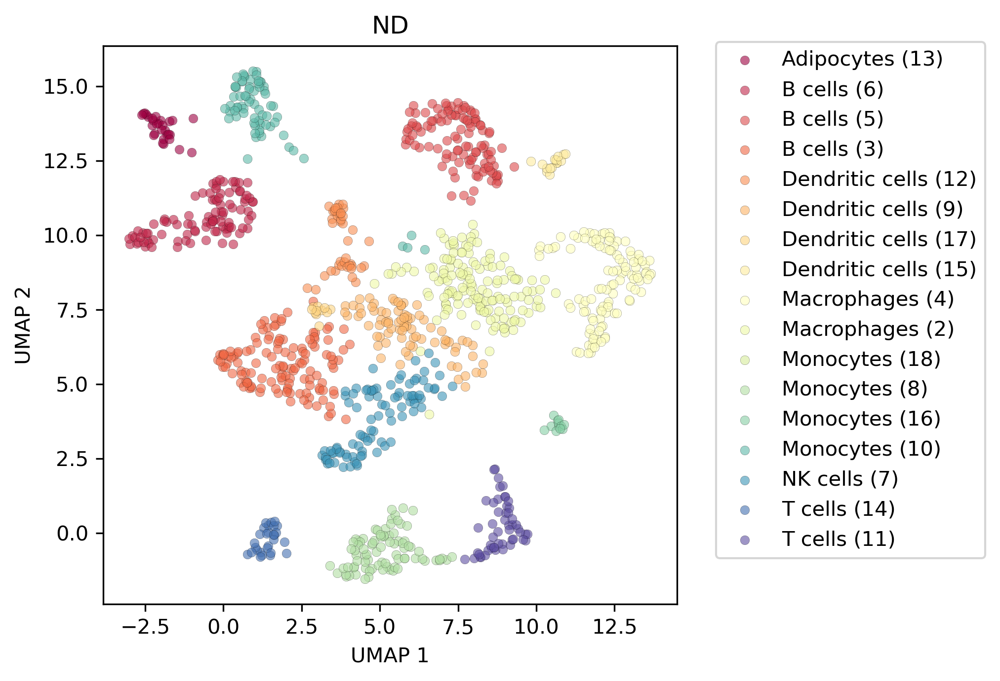

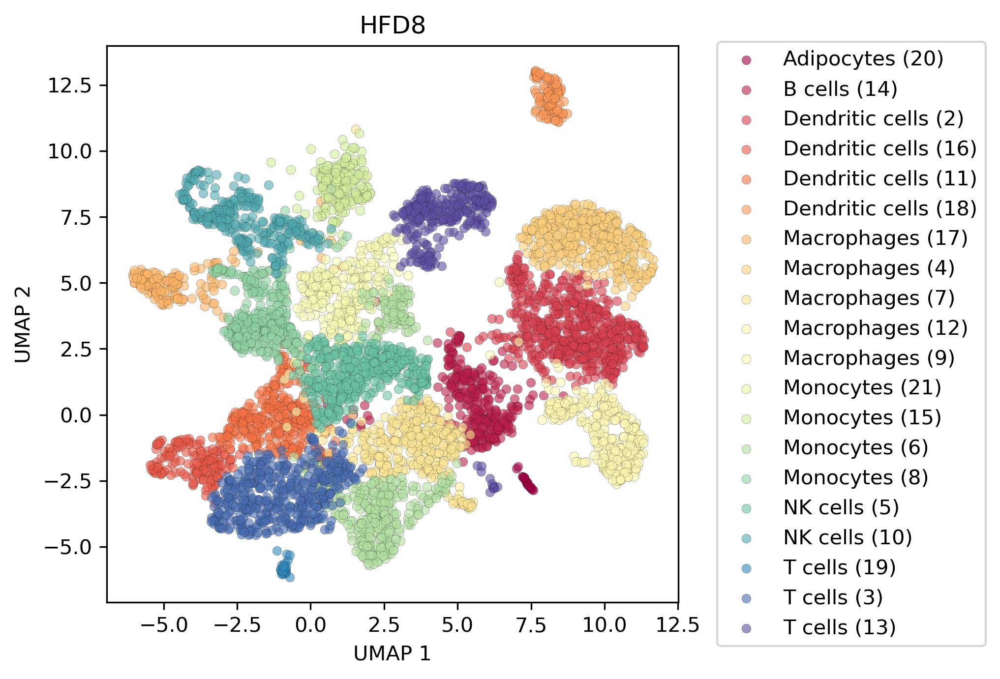

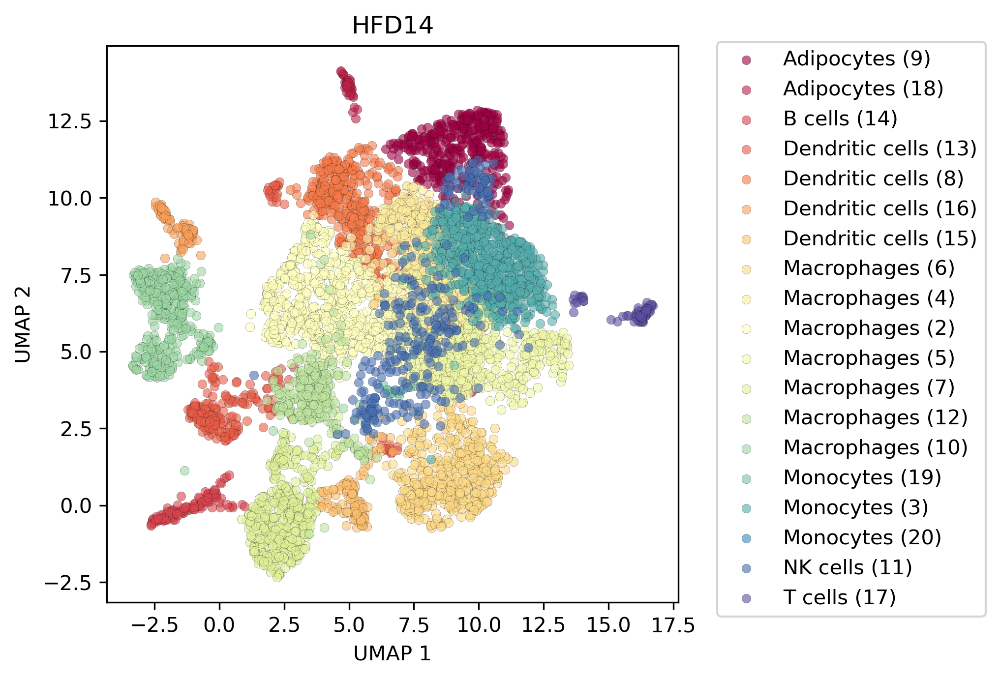

In [23]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    
    k = data.obs[runKey].nunique()
    colorlist = ut.ncolor(k, cmap='Spectral')
    
    embedding = data.obsm['X_umap']
    
    
    cellTypes = cellTypes.sort_values(by='cellType')
    colorInd = 0
    for idx, row in cellTypes.iterrows():
        c = colorlist[colorInd]
        colorInd += 1
        label = row['cellType']
        i = row['clusterId']
        
        plt.scatter(embedding[clusterIds == i , 0] , 
                    embedding[clusterIds == i , 1] , 
                    c=c,
                    edgecolor="k",
                    linewidth=0.1,
                    s=20,
                    alpha=0.6,
                    label=f"{label} ({i+1})",)
    
    plt.title(key)
    plt.legend(bbox_to_anchor=(1.05, 1.025))
    # handles, labels = plt.gca().get_legend_handles_labels()
    # labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    # plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.show()

# Color by cell type

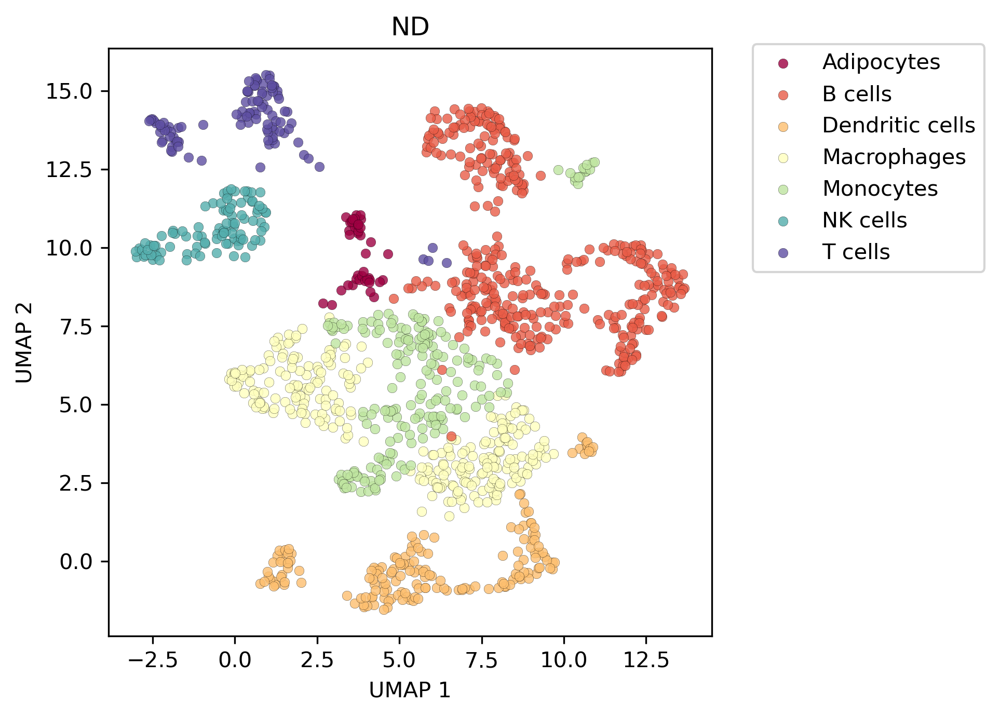

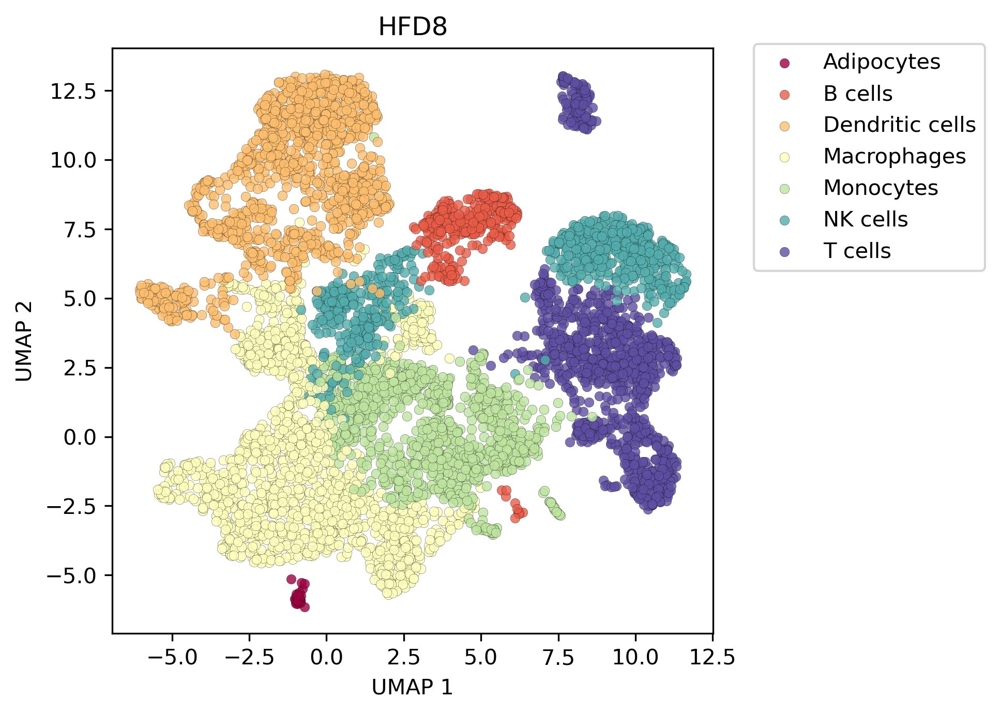

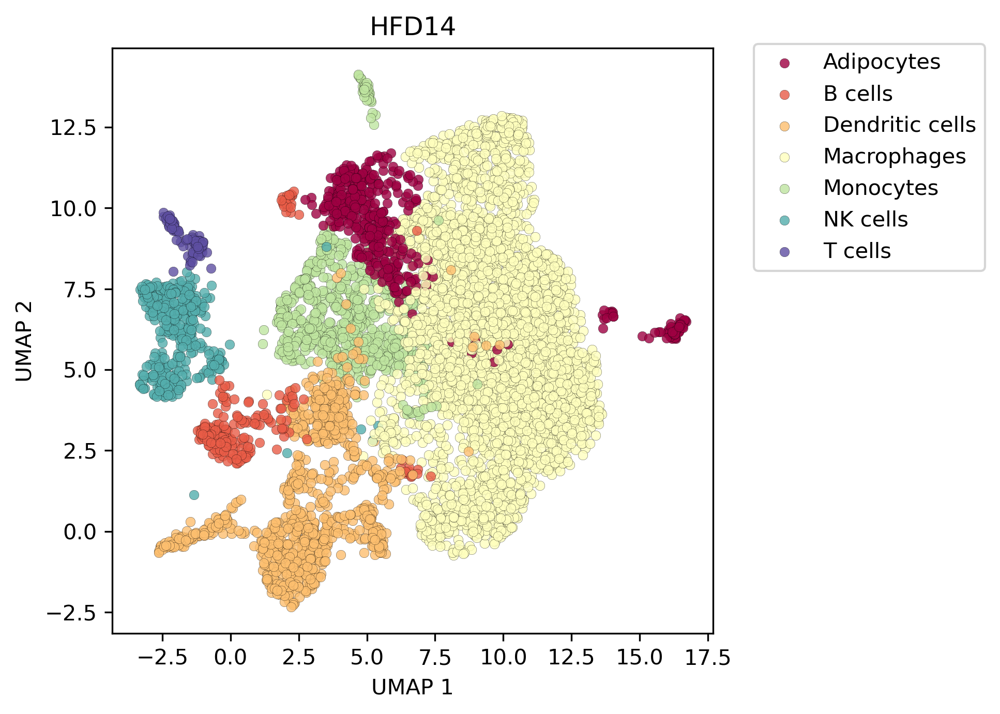

In [24]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']

ncolors = markerGenes['cell type'].nunique()
ctypes = sorted(markerGenes['cell type'].unique())

colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    k = data.obs[runKey].nunique()
    
    embedding = data.obsm['X_umap']
    
    seenlabels = []
    for i in range(k):
        label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
        if not label in seenlabels:
            seenlabels.append(label)
        
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8,
                        label=label,)
            
        else:
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8)
    
    plt.title(key)
    # sort both labels and handles by labels
    handles, labels = plt.gca().get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.savefig(f'{key}.png', bbox_inches='tight')
    plt.show()

In [25]:
# break

In [26]:
# # plot clusters using individual embeddings
# # shows how well defined the clusters are at a single time point
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# ncolors = markerGenes['cell type'].nunique()
# ctypes = sorted(markerGenes['cell type'].unique())

# colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))

# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     cellTypes = cellTypebyMax(scoreFrame[key])
    
#     nCellTypes = cellTypes['cellType'].nunique()
    
#     k = data.obs['leiden'].nunique()
    
#     embedding = pooled_embedding.iloc[indices[key]].to_numpy()
    
#     seenlabels = []
#     for i in range(k):
#         label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
#         if not label in seenlabels:
#             seenlabels.append(label)
        
#             plt.scatter(embedding[clusterIds == i , 0] , 
#                         embedding[clusterIds == i , 1] , 
#                         c=colordict[label],
#                         edgecolor="None",
#                         s=20,
#                         alpha=0.8,
#                         label=label,)
            
#         else:
#             plt.scatter(embedding[clusterIds == i , 0] , 
#                         embedding[clusterIds == i , 1] , 
#                         c=colordict[label],
#                         edgecolor="None",
#                         s=20,
#                         alpha=0.8)
    
#     plt.title(key)
#     # sort both labels and handles by labels
#     handles, labels = plt.gca().get_legend_handles_labels()
#     labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
#     plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
#     plt.xlabel("UMAP 1")
#     plt.ylabel("UMAP 2")
#     plt.show()

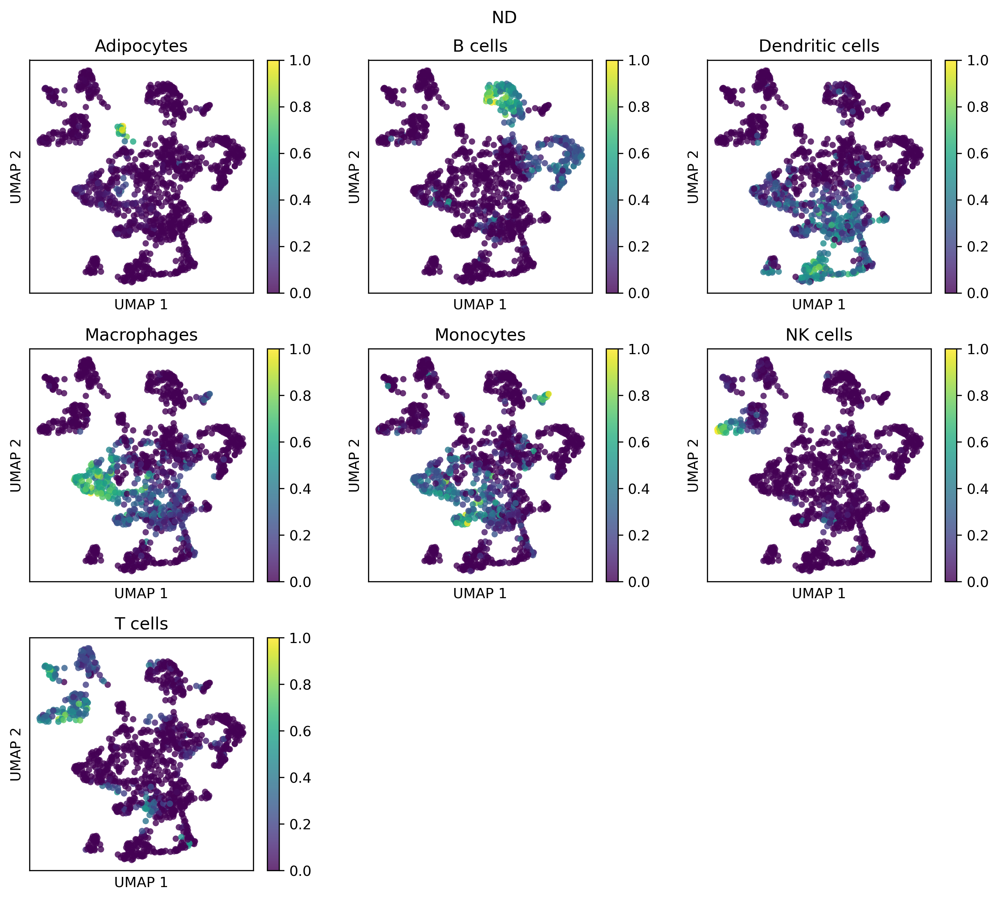

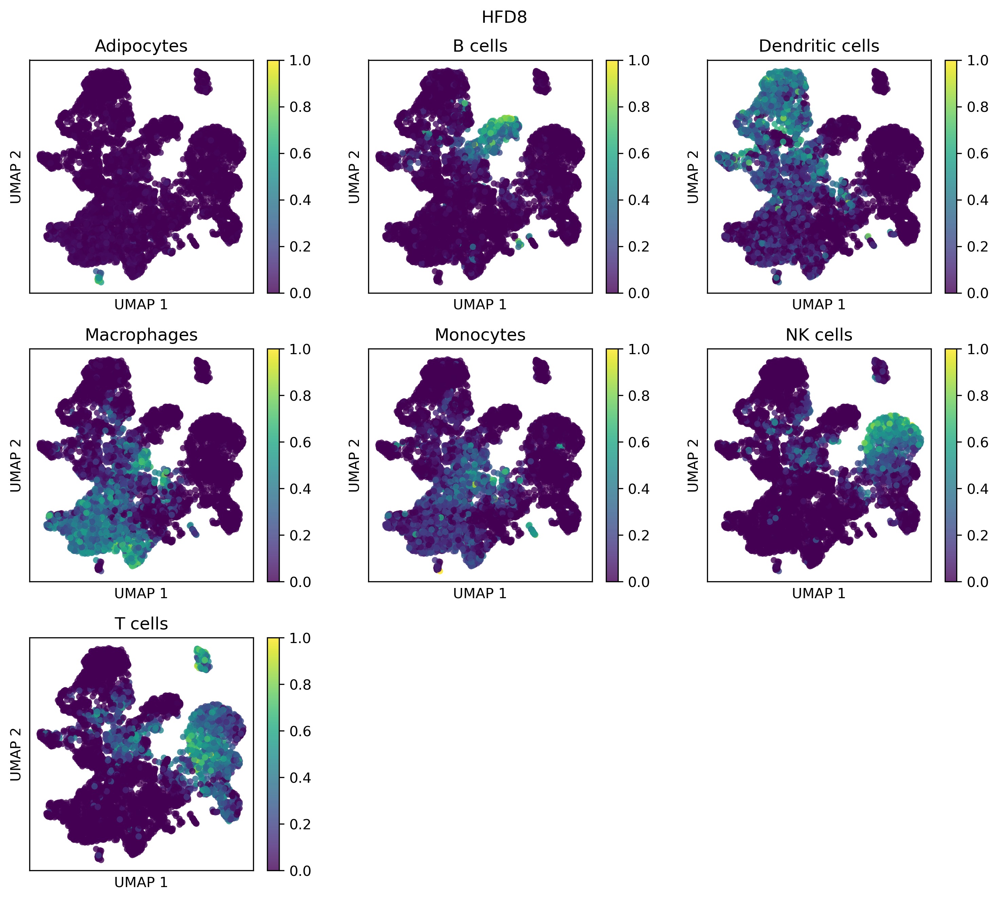

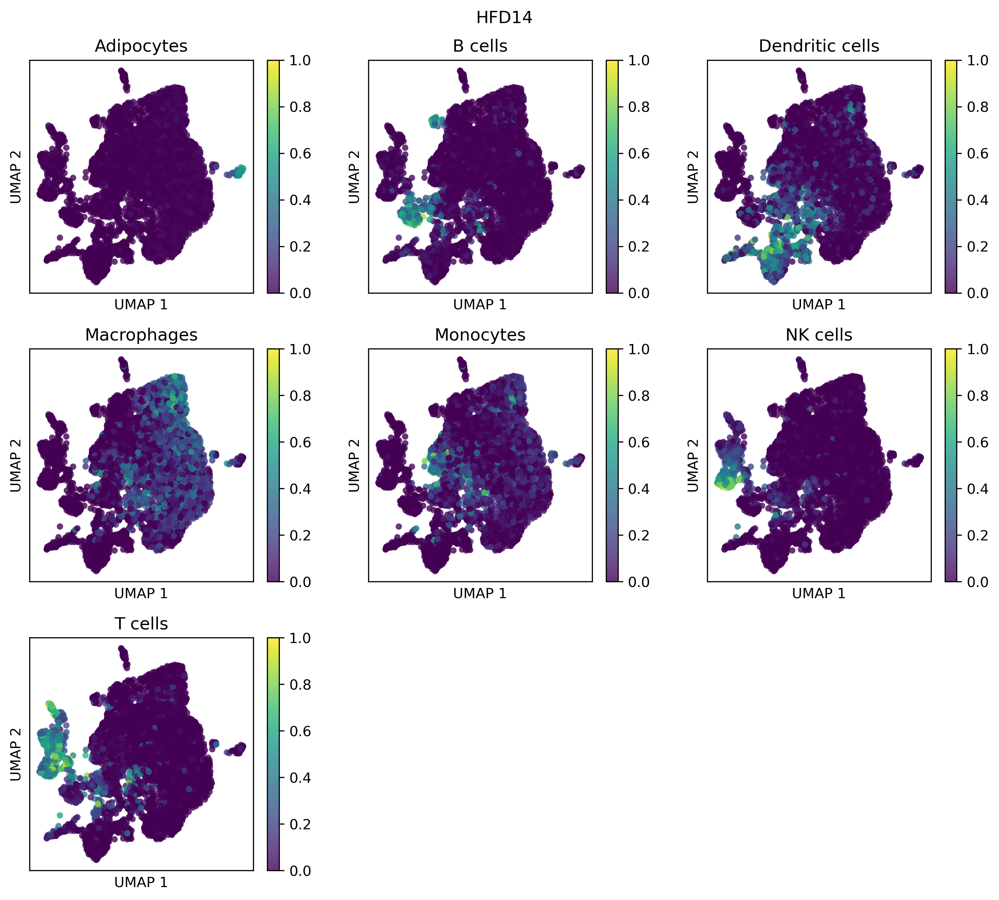

In [27]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 9

keys = ['ND', 'HFD8', 'HFD14']

includeClusterPlot = False

def nearest_square(num):
    return int(np.ceil(np.sqrt(num))**2)

for key in keys:
    data = adata[key]
    df = data.to_df()
    embedding = data.obsm['X_umap']
    
    nFig = nearest_square(len(ctype) + 1 )
    toRemove = int(nFig - len(ctype)) + 1
    
    fig, axs = plt.subplots(int(np.sqrt(nFig)), int(np.sqrt(nFig)))
    axs = axs.ravel()
    
    bummper = 0
    if includeClusterPlot:    
        img = mpimg.imread(f'{key}.png')
        axs[0].imshow(img)
        axs[0].axis(False)
        bummper = 1
    
    """
    NOTE: we use all the marker genes for this
    """
    for i, ctype in enumerate(allMarkers['cell type'].unique()):
        mGenes = allMarkers[allMarkers['cell type'] == ctype]['gene'].to_list()
        intesect = set(df.columns).intersection(set(mGenes))
        
        meanGExp = df[intesect].mean(axis=1).to_numpy()
        meanGExp *= (1.0/meanGExp.max())
        
        p = axs[i+bummper].scatter(embedding[: , 0] , 
                       embedding[:, 1] , 
                       c=meanGExp,
                       edgecolor="None",
                       s=20,
                       alpha=0.8,
                       vmin=0,
                       vmax=1)
        
        plt.colorbar(p, ax=axs[i+bummper])
        
        axs[i+bummper].set_xticks([])
        axs[i+bummper].set_yticks([])
        axs[i+bummper].set_xlabel('UMAP 1')
        axs[i+bummper].set_ylabel('UMAP 2')
        axs[i+bummper].set_title(ctype)

    plt.suptitle(key)
    plt.tight_layout()
    # clean up the plot
    for k in range((i+1+bummper), (i+toRemove)):
        axs[k].set_axis_off()

    plt.show()

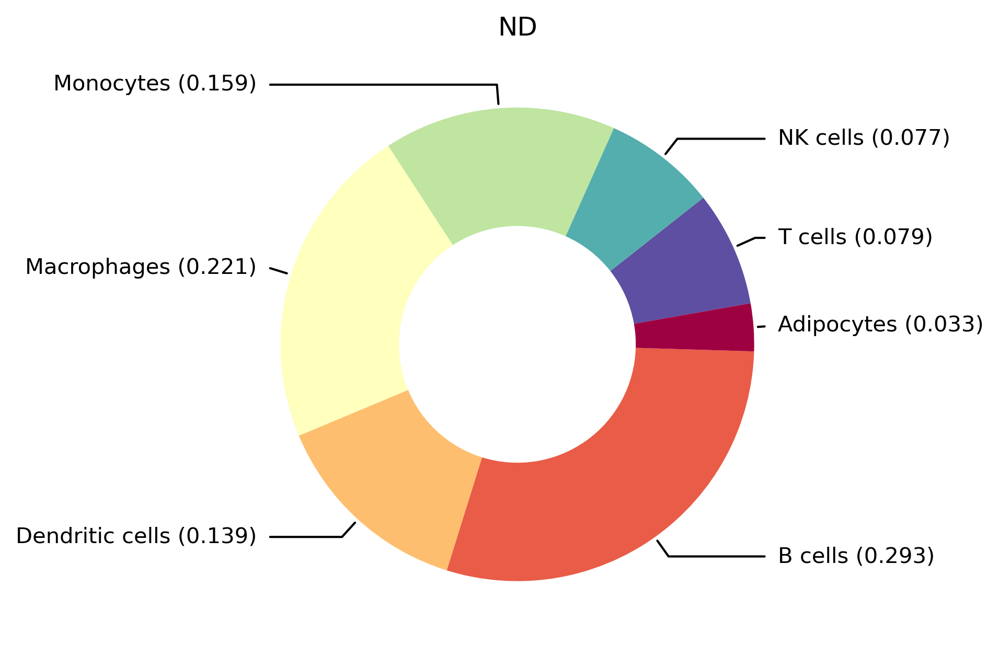

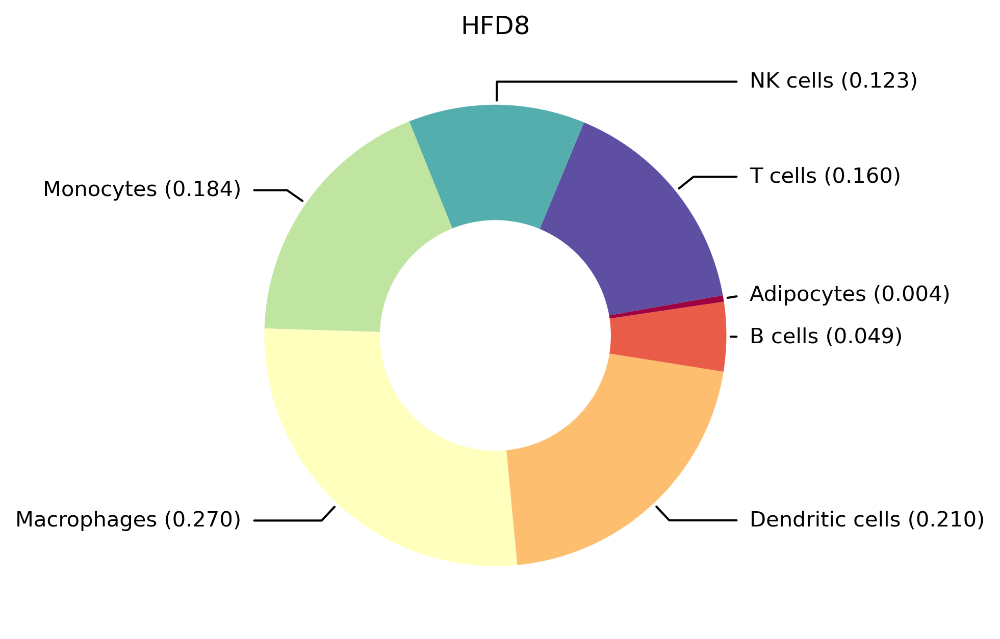

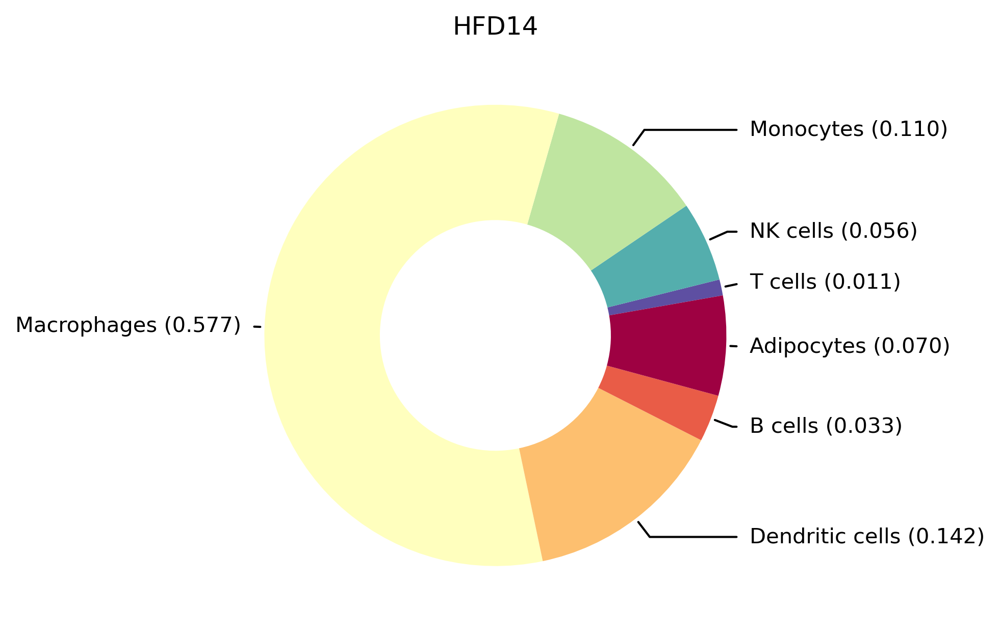

In [28]:
keys = ['ND', 'HFD8', 'HFD14']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    clusterCount = pd.DataFrame(data.obs[runKey].astype(int).value_counts(normalize=True))
    clusterCount.columns = ['proportion'] 
    clusterCount['clusterId'] = clusterCount.index + 1
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = pd.merge(cellTypes,
                         clusterCount, 
                         on='clusterId', 
                         how='left')
    
    grped = cellTypes.groupby('cellType')['proportion'].sum()
    grped = grped.sort_index(ascending=False).reset_index()
    
    grped['color'] = grped['cellType'].map(colordict)
    ctypeList = grped['cellType'].to_list()
    prop = grped['proportion'].to_list()
    
    wedges, texts = plt.pie(grped['proportion'],
                            # labels=grped['cellType'],
                            # autopct='%1.1f%%',
                            wedgeprops=dict(width=0.5),
                            colors=grped['color'],
                            pctdistance=0.6, 
                            startangle=10)
    
    bbox_props = dict(fc="w", ec="w", lw=0.72)
    kw = dict(arrowprops=dict(arrowstyle="-"),
              bbox=bbox_props, 
              zorder=0, 
              va="center")
    
    ax = plt.gca()
    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        
        annotation = f"{ctypeList[i]} ({prop[i]:.3f})"
        
        ax.annotate(annotation, xy=(x, y), xytext=(1.1*np.sign(x), 1.1*y),
                    horizontalalignment=horizontalalignment, **kw)
    
    
    plt.ylabel("")
    plt.title(key)
    plt.show()

# Store data

In [29]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    fName = f"{outpath}{key}.adata"
    data.write(fName)
    print(f"done: {fName}")

done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/ND.adata
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD8.adata
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD14.adata


# Store signatures


In [30]:
keys = ['ND', 'HFD8', 'HFD14']


for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    diffs = scoreDiffs[key]
    allscores = scoreFrame[key]
    
    """
    BUILD EXCEL BOOK
    """
    outputDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"
    fname = f"{outputDir}{key}_clusterResults.xlsx"
    print(f'working {key}...')
    
    with pd.ExcelWriter(fname) as writer:  
        cellTypes.to_excel(writer, sheet_name=f'{key}_clusters', index=False)
        diffs.to_excel(writer, sheet_name=f'{key}_diffs', index=False)
        allscores.to_excel(writer, sheet_name=f'{key}_allScores', index=False)
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            t['pvals'] = result['pvals'][clusterId]
            t['clusterId'] = int(clusterId) + 1

            sheetName = f"cluster_{int(clusterId) + 1}"
            t.to_excel(writer, sheet_name=sheetName, index=False)
            
print('done')

working ND...
working HFD8...
working HFD14...
done


# Macrophage Sub Type

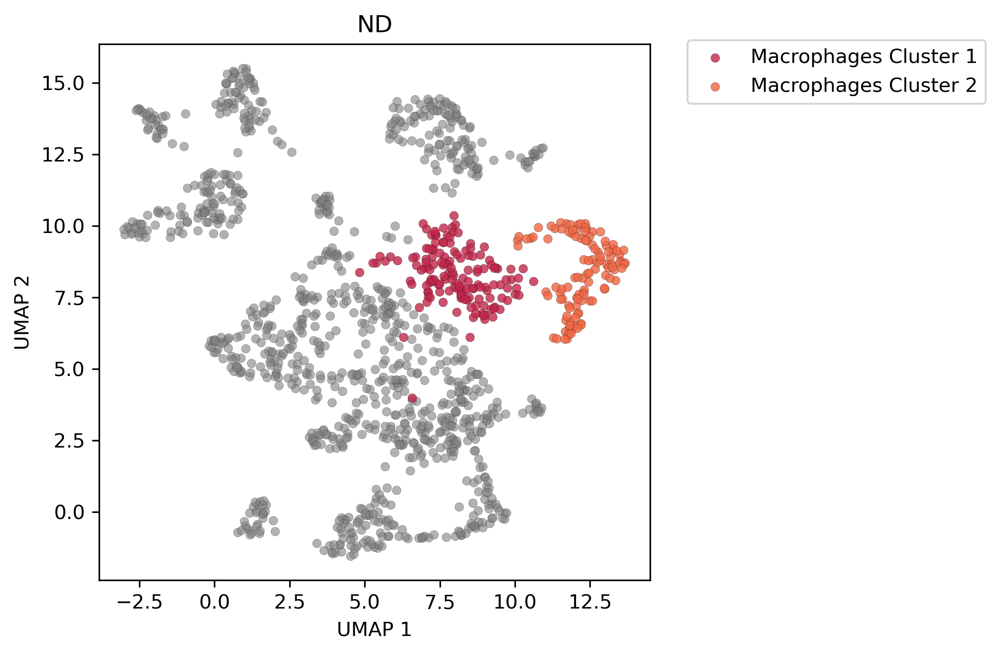

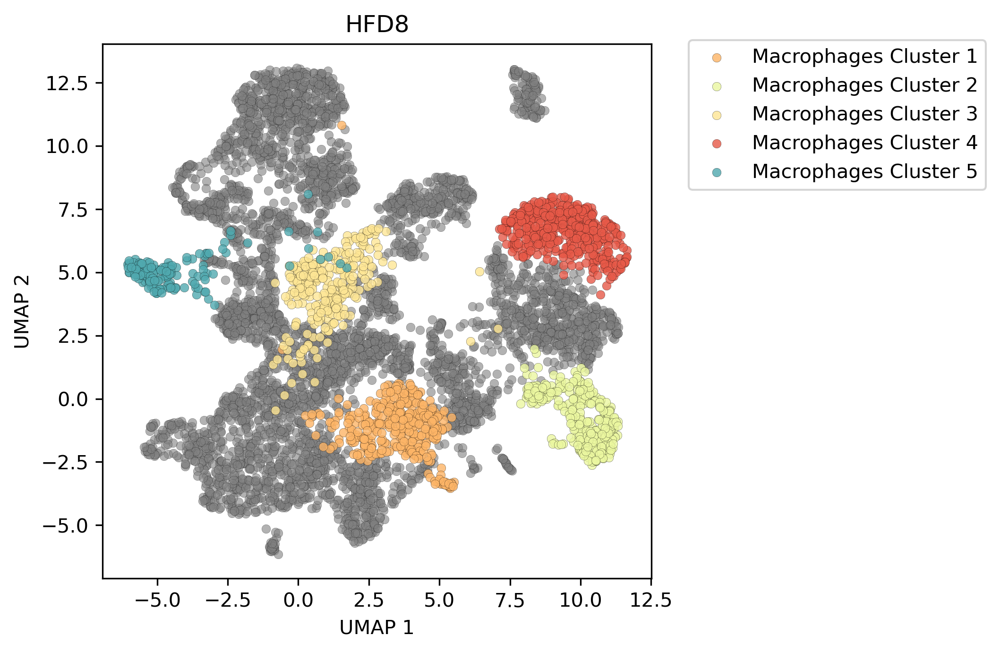

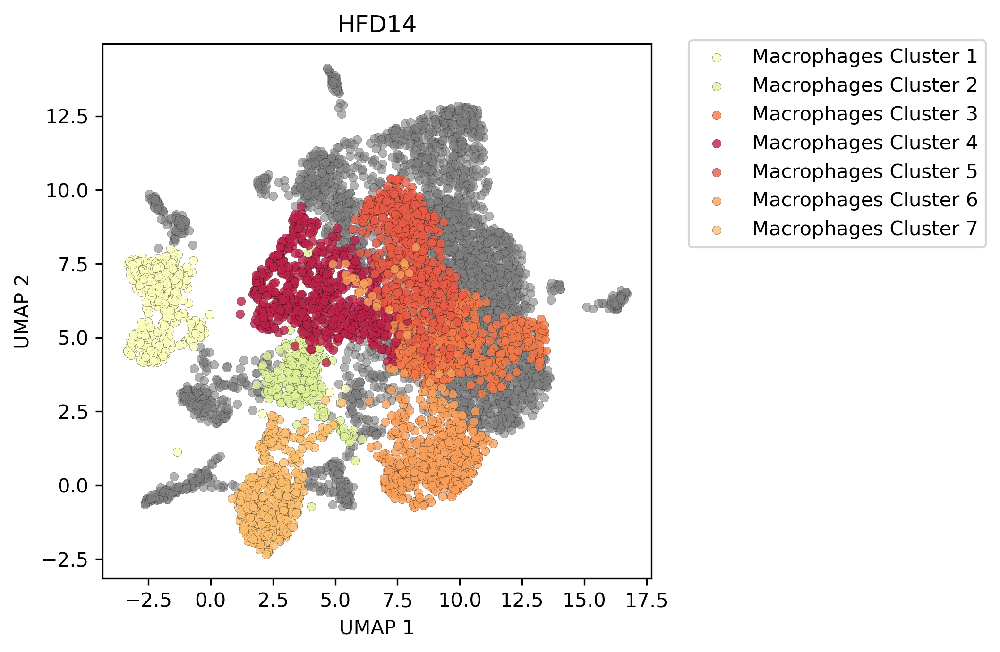

In [31]:
cellType = 'Macrophages'

keys = ['ND', 'HFD8', 'HFD14']

for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int)
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    # get number of clusterss
    k = data.obs[runKey].nunique()
    colorlist = ut.ncolor(k, cmap='Spectral')
    
    # get all clusters for the cell type
    cellTypeIds = cellTypes[cellTypes['cellType'] == cellType]['clusterId'].to_numpy()
    
    # get 2d coordinates
    embedding = data.obsm['X_umap']
    
    """
    PLOT background
    """
    cellInd = clusterIds.isin(cellTypeIds)

    plt.scatter(embedding[~cellInd, 0],
                embedding[~cellInd, 1],
                c='grey',
                edgecolor="k",
                linewidth=0.1,
                s=20,
                alpha=0.6)
    
    for i, ctid in enumerate(cellTypeIds):
        cellInd = (clusterIds == ctid)
        
        label = f"{cellType} Cluster {i+1}"
        
        plt.scatter(embedding[cellInd, 0],
                    embedding[cellInd, 1],
                    c=colorlist[ctid],
                    edgecolor="k",
                    linewidth=0.1,
                    s=20,
                    alpha=0.8,
                    label=label)

    plt.title(key)
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.legend(bbox_to_anchor=(1.05, 1.025))
    plt.show()
    

In [32]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# Time Series

In [ ]:
cellType = 'Macrophages'

keys = ['ND', 'HFD8', 'HFD14']


# first, get genes expressed over all times

allGenes = []

for key in keys:
    data = adata[key]
    genes = set(data.to_df().columns)
    allGenes.append(genes)

commmonGenes = list(set.intersection(*allGenes))

ct = {}

for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int)
    df = data.to_df()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    # get all clusters for the cell type
    cellTypeIds = cellTypes[cellTypes['cellType'] == cellType]['clusterId'].to_list()
    
    # get all cells in all cluster of cell type
    cellInd = clusterIds.isin(cellTypeIds)
    cf = df[cellInd]
    
    # use only genes common across time points
    cf = cf[commmonGenes]
    
    ct[key] = cf
    
    
print('done')

In [ ]:
# run t-tests for each pair of timepoints
top = 10 # number of genes to print
    
timeSeries = []    
    
for ak, bk in itertools.combinations(ct.keys(), 2):
    adf = ct[ak]
    bdf = ct[bk]
    
    newRows = []
    
    for gene in commmonGenes:
        score, pval = stats.ttest_ind_from_stats(
            mean1=adf[gene].mean(),
            std1=adf[gene].std(),
            nobs1=len(adf),
            mean2=bdf[gene].mean(),
            std2=bdf[gene].std(),
            nobs2=len(bdf),
            equal_var=False,  # Welch's
        )
        
        row = {
            'gene' : gene,
            'score' : score,
            'pval' : pval,
        }
        
        newRows.append(row)

    res = pd.DataFrame(newRows)
    res['comp'] = f"{ak}v{bk}"
    
    res = res.sort_values(by='score', ascending=False)
    print(f"============== {ak} vs {bk} ==============")
    print(f"======== Top: {top} Genes")
    print(res.head(top))
    # print(f"======== Bottom: {top} Genes")
    # print(res.tail(top))
    print()


In [ ]:
cellType = 'Macrophages'
keys = ['ND', 'HFD8', 'HFD14']

for gene in markerGenes[markerGenes['cell type'] == cellType]['gene']:
    dfList = []
    
    if not gene in commmonGenes:
        continue
    stds = []
    for key in keys:
        data = adata[key]

        clusterIds = data.obs[runKey].astype(int)
        df = data.to_df()
        cellTypes = cellTypebyMax(scoreFrame[key])

        # get all clusters for the cell type
        cellTypeIds = cellTypes[cellTypes['cellType'] == cellType]['clusterId'].to_list()

        # get all cells in all cluster of cell type
        cellInd = clusterIds.isin(cellTypeIds)
        cf = df[cellInd]
        
        gcf = pd.DataFrame(cf[gene].reset_index(drop=True))
        stds.append(cf[gene].std())
        gcf['Time'] = key
        dfList.append(gcf)

    res = pd.concat(dfList, ignore_index=True)

    # don't plot the boring ones where normalization is
    # the only difference
    if not np.sum(stds) < 3:
        print(gene)
        # plt.rcParams['figure.dpi'] = 300
        # plt.rcParams['figure.figsize'] = 3, 3
        # sns.boxplot(data=res, 
        #             x='Time',
        #             y=gene,
        #             showfliers=False,
        #             palette='viridis')
        # plt.ylabel('Expression')
        # plt.title(gene)
        # plt.show()